**<h1> Pillow Library (PIL)</h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing, transmitting, and gathering images through the internet. 

Python is an excellent choice as it has many image processing tools, computer vision and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and on the internet.

A digital image is simply a file in your computer. In this lab, you will gain an understanding of these files and learn to work with these files with the Pillow Library (PIL).


<ul>
    <li><a href='#PIL'>Python Image Libraries </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li> PIL Images into NumPy Arrays  </li>
        </ul>
    </li>
    
</ul>


----


Download the images for the lab:


In [1]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will not need to understand the code below at this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [6]:
def get_concat_h(im1, im2):
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height)) # tạo ảnh mới chế độ RGB, chiều rộng bằng tổng chiều rộng 2 ảnh và cao bằng ảnh thứ nhất
    dst.paste(im1, (0, 0)) #dán ảnh im1 vào bên trái ảnh mới, bắt đầu từ tọa độ (0, 0)
    dst.paste(im2, (im1.width, 0)) #dán ảnh im2 vào bên phải ảnh mới, bắt đầu tại vị trí ngay sau ảnh im1
    return dst # trả về ảnh đã được ghép theeo chiều ngang

## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [7]:
my_image = "lenna.png" # gán tên file ảnh cho biến 

A filename consists of two parts: the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the Image. There are two popular image formats: Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [4]:
import os # làm việc với hệ điều hành
cwd = os.getcwd() # lấy đường dẫn thư mục làm việc hiện tại và gán vào biến cwd
cwd # hiển thị giá trị của biến cwd

'd:\\Learning\\Thị giác máy tính\\Lab1'

The "path" to an image can be found using the following line of code.


In [8]:
image_path = os.path.join(cwd, my_image) # tạo đường dẫn thư mục hiện tại cwd với tên file ảnh my_image để tạo đường dẫn đầy đủ tới ảnh
image_path #hiển thị đường dẫn đầy đủ tới file ảnh

'd:\\Learning\\Thị giác máy tính\\Lab1\\lenna.png'

## Load Images in Python


Pillow (PIL) library is a popular library for loading images in Python. In addition, many other libraries such as "Keras" and "PyTorch" use this library to work with images. The `Image` module provides functions to load images from and saving images to the file system. Let's import it from `PIL`.


In [ ]:
from PIL import Image #import lớp Image từ thư viện Pilow (PIL) để mở, xử lý và lưu ảnh

If the image is in the current working directory, you can load the image as follows using the image's filename and create a PIL Image object:


In [10]:
image = Image.open(my_image) #mở file ảnh có tên my_image và lưu đối tượng ảnh vào biến image
type(image) #kiểm tra và hiển thị kiểu dữ liệu của biến image

PIL.PngImagePlugin.PngImageFile

If you are working in a Jupyter environment, you can view the image by calling the variable itself.  


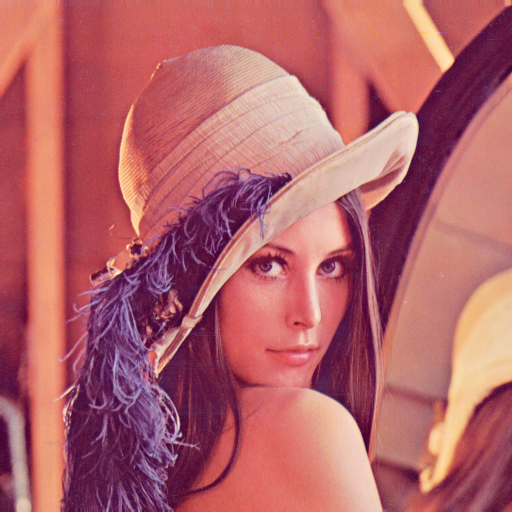

In [ ]:
image # hiển thị ảnh 

##  Plotting an Image 


We can also use the method `show` of PIL objects to display the image. Please note this method may or may not work depending on your setup.


In [ ]:
image.show() #hiển thị ảnh bằng trình xem ảnh mặc định của hệ điều hành

You can also use <code>imshow</code> method from the <code>matplotlib</code> library to display the image.


In [ ]:
import matplotlib.pyplot as plt #khai báo module matplotlib.pyplot và đặt bí danh là plt để vẽ và hiển thị đồ họa, hình ảnh

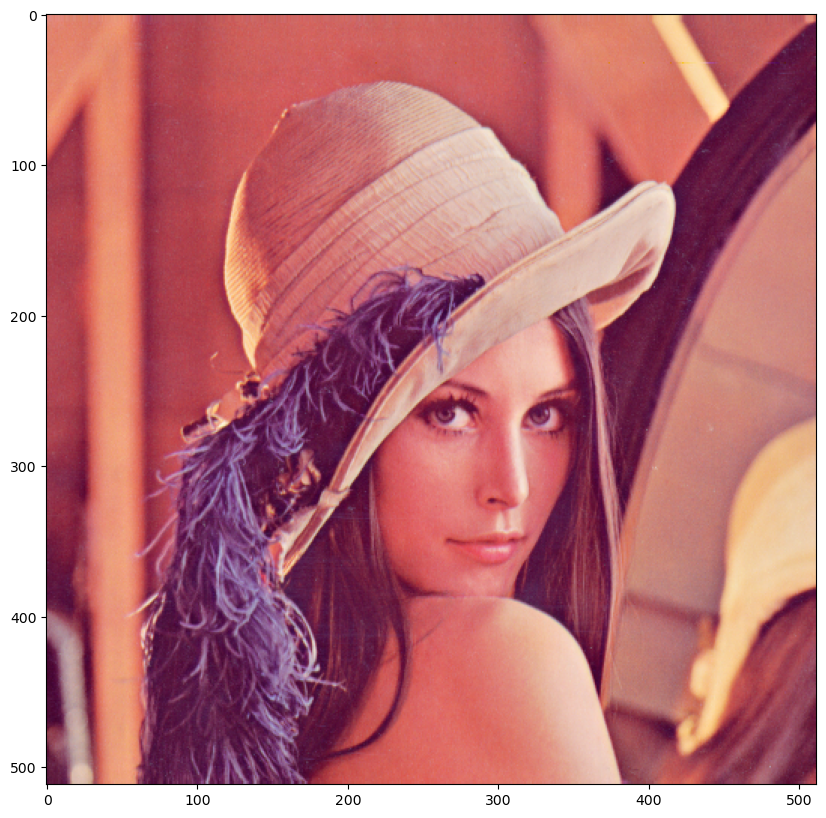

In [14]:
plt.figure(figsize=(10,10)) # tạo cửa sổ hiển thị mới với kích thước 10x10 inch
plt.imshow(image) # hiển thị ảnh từ biến image lên cửa sổ vừa tạo
plt.show() # hiển thị hình ảnh

You can also load the image using its full path. This comes in handy if the image is not in your working directory.


In [15]:
image = Image.open(image_path) #mở file ảnh tại đường đẫn image_path và lưu đối tượng ảnh vào biến image

We can use the attributes of the image object to get information. The attribute format is the extension or format of the image.


The attribute `size` returns a tuple, the first element is the number of pixels that comprise the width and the second element is the number of pixels that make up the height of the image.   


In [ ]:
print(image.size) # hiển thị kích thước ảnh dưới dạng (chiều rộng, chiều cao)

(512, 512)


This is a string specifying the pixel format used. In this case, it's “RGB”. RGB is a color space where red, green, and blue are added together to produce other colors.



In [ ]:
print(image.mode) #hiển thị chế độ màu của ảnh

RGB


The `Image.open` method does not load image data into the computer memory. The `load` method of `PIL` object reads the file content, decodes it, and expands the image into memory.


In [18]:
im = image.load() #nạp dữ liệu pixel của ảnh và gán vào biến im để truy cập hoặc chỉnh sửa

We can then check the intensity of the image at the $x$-th column and $y$-th row:


In [ ]:
x = 0 #gán tọa độ cột (trục x) = 0
y = 1 #gán tọa độ hàng (trục y) = 1
im[y,x] #lấy giá trị pixel tại vị trí hàng y và cột x của ảnh, trả về giá trị màu (R, G, B)

(226, 137, 125)

We will use the array form to access the elements; it is slightly different.


You can save the image in `jpg` format using the following command.


In [ ]:
image.save("lenna.jpg") # lưu ảnh image ra file mới có tên lenna.jpg trong thư mục làm việc hiện tại

## Grayscale Images, Quantization and Color Channels  


### Grayscale Images


The `ImageOps` module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.


In [ ]:
from PIL import ImageOps #import module ImageOps từ thư viện Pillow để thực hiện các phép biến đổi ảnh

Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.


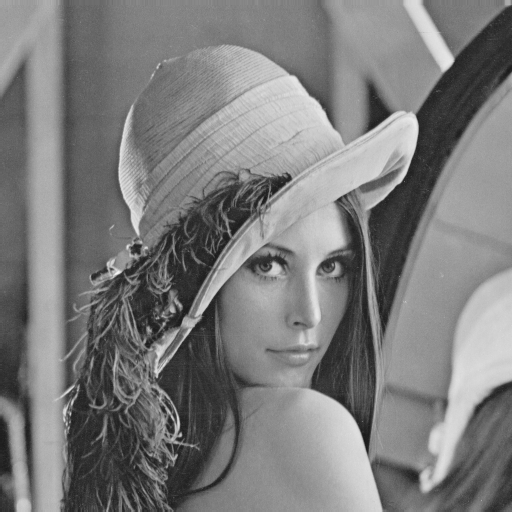

In [ ]:
image_gray = ImageOps.grayscale(image) #chuyển ảnh sang màu xám (grayscale) và lưu vào biến image_gray
image_gray #hiển thị ảnh màu xám

The mode is `L` for grayscale.


In [ ]:
image_gray.mode #kiểm tra và hiển thị chế độ màu của ảnh xám

'L'

### Quantization


The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method `quantize`. Let's repeatably cut the number of levels in half and observe what happens:


Half the levels do not make a noticable difference.


In [ ]:
image_gray.quantize(256 // 2) #giảm số mức xám của ảnh xuống 256//2=128
image_gray.show() #hiển thị ảnh xám bằng trình xem ảnh mặc định

Let’s continue dividing the number of values by two and compare it to the original image.


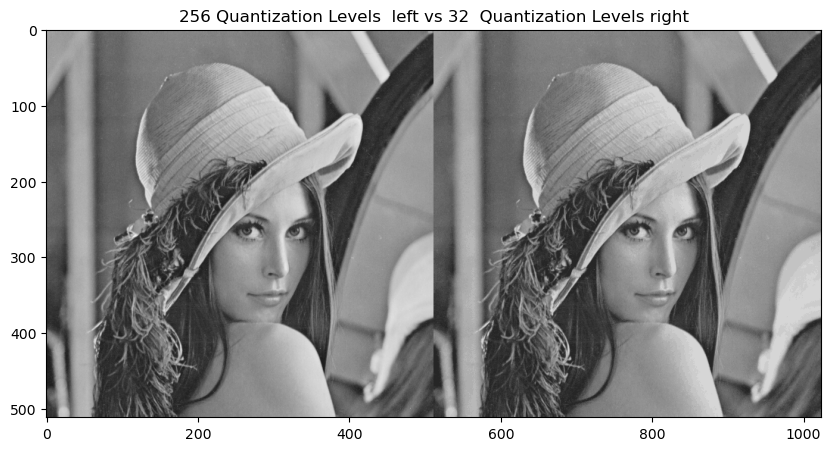

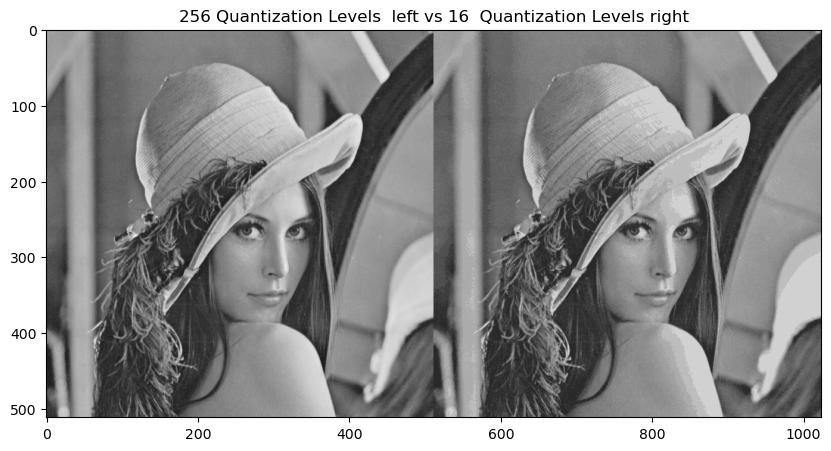

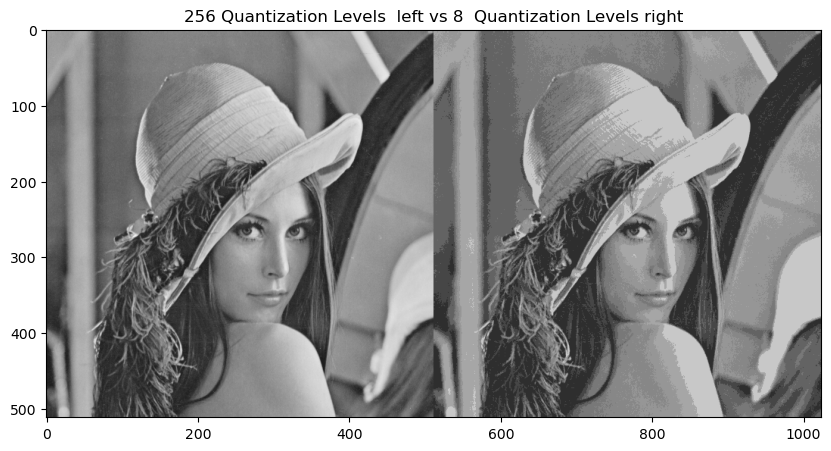

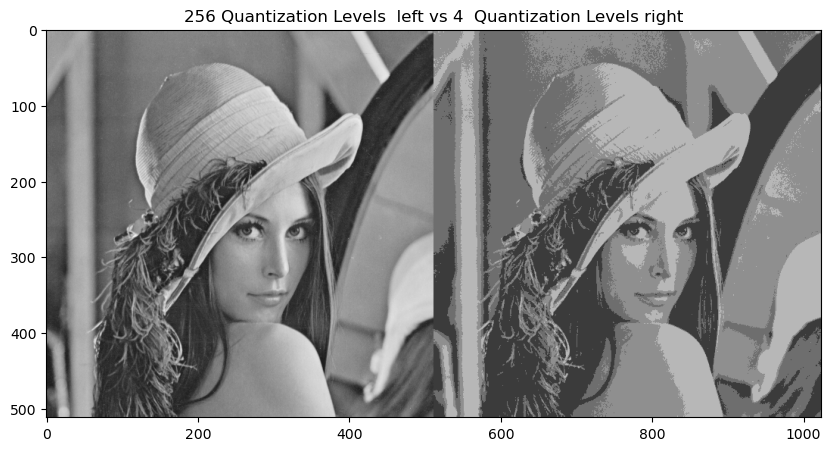

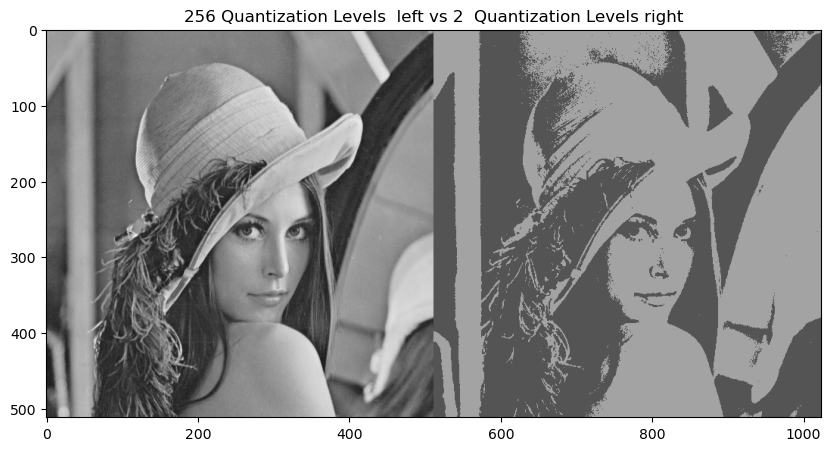

In [ ]:
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena") 
for n in range(3,8): #vòng lặp từ 3 đến 7 để thử các mức lượng tử hóa khác nhau
    plt.figure(figsize=(10,10)) #tạo cửa sổ hiển thị mới kích thước 10x10 inch

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) #ghép ảnh gốc (256 mức xám) bên trái với ảnh lượng tử hóa 256//2**n mức xám bên phải và hiển thị
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n)) #đặt tiêu đề so sánh ảnh gốc và ảnh đã lượng tử hóa với số mức tương ứng
    plt.show() #hiển thị hình ảnh

### Color Channels  


We can also work with the different color channels. Consider the following image:


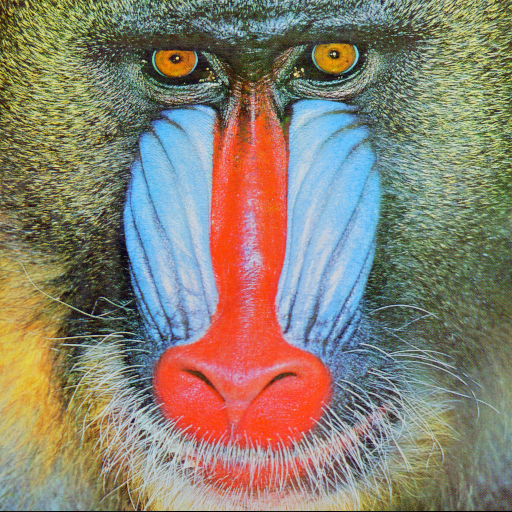

In [ ]:
baboon = Image.open('baboon.png') #mở file ảnh và lưu vào biến baboon
baboon #hiển thị ảnh baboon

We can obtain the different RGB color channels and assign them to the variables <code>red</code>, <code>green</code>, and <code>blue</code>:


In [ ]:
red, green, blue = baboon.split() #tách ảnh màu baboon thành ba kênh màu riêng biệt: đỏ, xanh lá và xanh dương

Plotting the color image next to the red channel as a grayscale, we see that regions with red have higher intensity values.


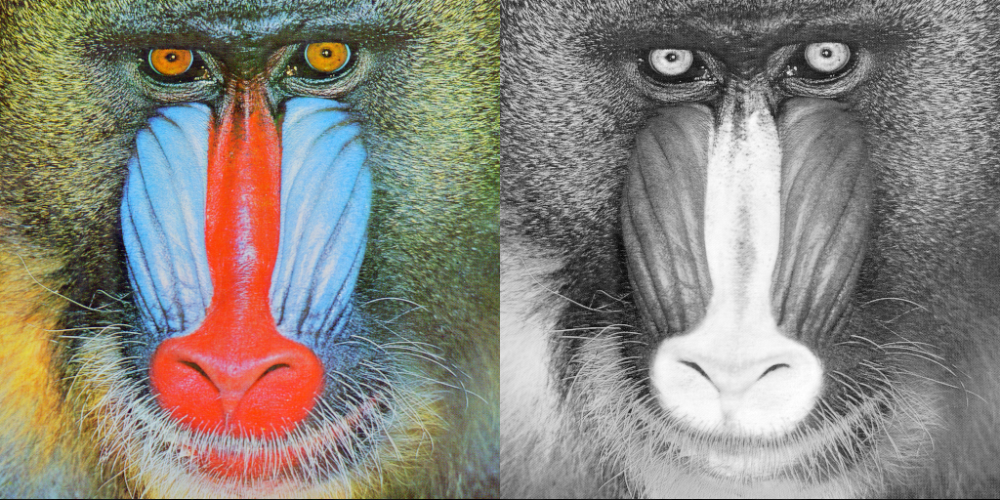

In [29]:
get_concat_h(baboon, red) #ghép ảnh gốc baboon bên trái với kênh màu đỏ bên phải và hiển thị

We can do the same for the blue and green channels:


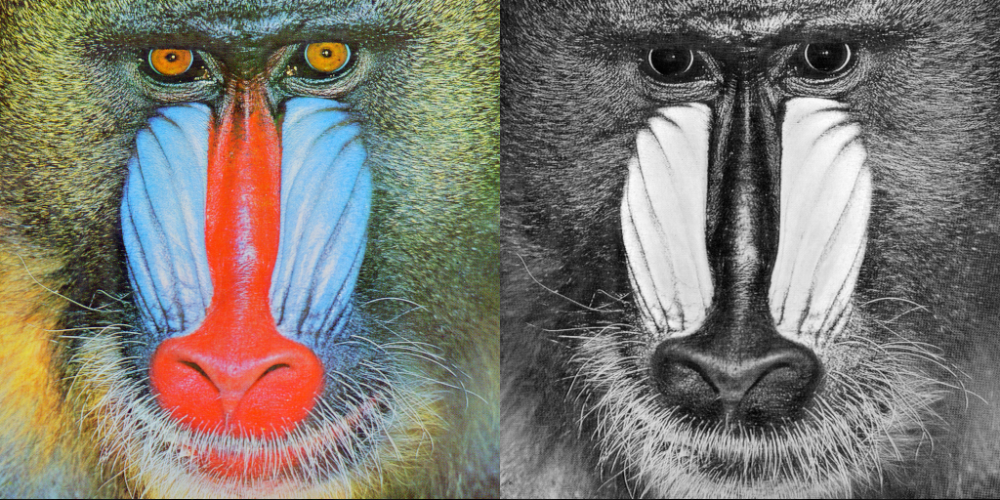

In [30]:
get_concat_h(baboon, blue) #ghép ảnh gốc baboon bên trái với kênh màu xanh dương bên phải và hiển thị

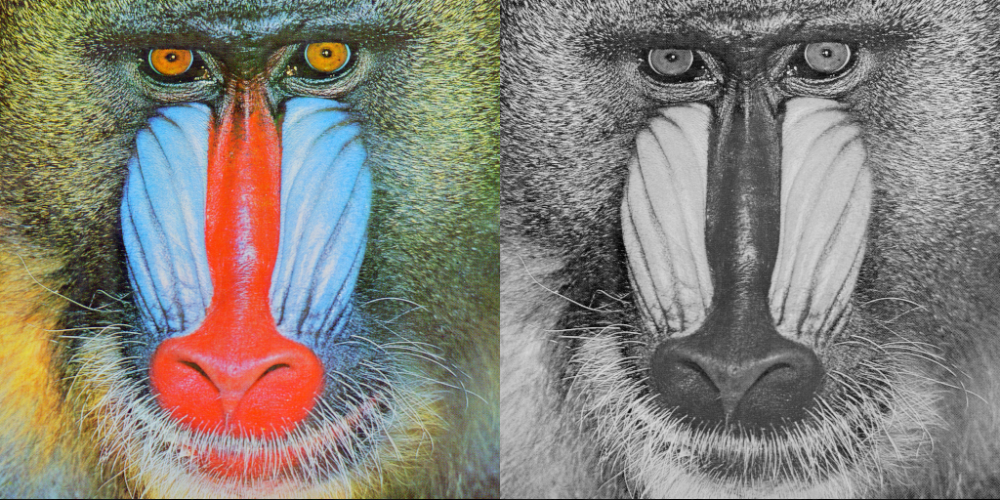

In [31]:
get_concat_h(baboon, green) #ghép ảnh gốc baboon bên trái với kênh màu xanh lá bên phải và hiển thị

## PIL Images into NumPy Arrays


NumPy is a library for Python, allowing you to work with multi-dimensional arrays and matrices. We can convert a PIL image to a NumPy array. We use <code>asarray()</code> or <code>array</code> function from NumPy to convert PIL images into NumPy arrays. 

First, let's import the numpy module:


In [28]:
import numpy as np #khai báo thư viện numpy và đặt bí danh là np

We apply it to the <code>PIL</code> image we get a numpy array:


In [ ]:
array= np.asarray(image) #chuyển ảnh image thành mảng numpy và lưu vào biến array
print(type(array)) #in ra kiểu dữ liệu của biến array

<class 'numpy.ndarray'>


`np.asarray` turns the original image into a numpy array. Often, we don't want to manipulate the image directly, but instead, create a copy of the image to manipulate. The `np.array` method creates a new copy of the image, such that the original one will remain unmodified.


In [ ]:
array = np.array(image) #chuyển ảnh image thành mảng numpy và lưu vào biến array

The attribute  <code>shape</code> of a `numpy.array` object returns a tuple corresponding to the dimensions of it, the first element gives the number of rows or height of the image,  the second is element is the number of columns or width of the image. The final element is the number of colour channels.


In [ ]:
# summarize shape
print(array.shape) #in ra kích thước của mảng numpy biển diễn ảnh (chiều cao, chiều rộng, số kênh màu)

(512, 512, 3)


or <code>(rows, columns, colors)</code>. Each element in the color axis  corresponds to the following value  <code>(R, G, B)</code> format.


We can view the intensity values by printing out the array, they range from 0 to 255 or $2^{8}$ (8-bit).


In [ ]:
print(array) #in ra toàn bộ giá trị mảng numpy của ảnh, tức là các giá trị pixel

[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


The Intensity values are  8-bit unsigned datatype.


In [36]:
array[0, 0] #truy cập và trả về giá trị pixel tại vị trí hàng 0, cột 0 của ảnh

array([226, 137, 125], dtype=uint8)

We can find the maximum and minimum intensity value of the array:      


In [ ]:
array.min() #tìm và trả về giá trị pixel nhỏ nhất trong toàn bộ mảng ảnh

np.uint8(3)

In [38]:
array.max() #tìm và trả về giá trị pixel lớn nhất trong toàn bộ mảng ảnh

np.uint8(255)

### Indexing  


You can plot the array as an image:


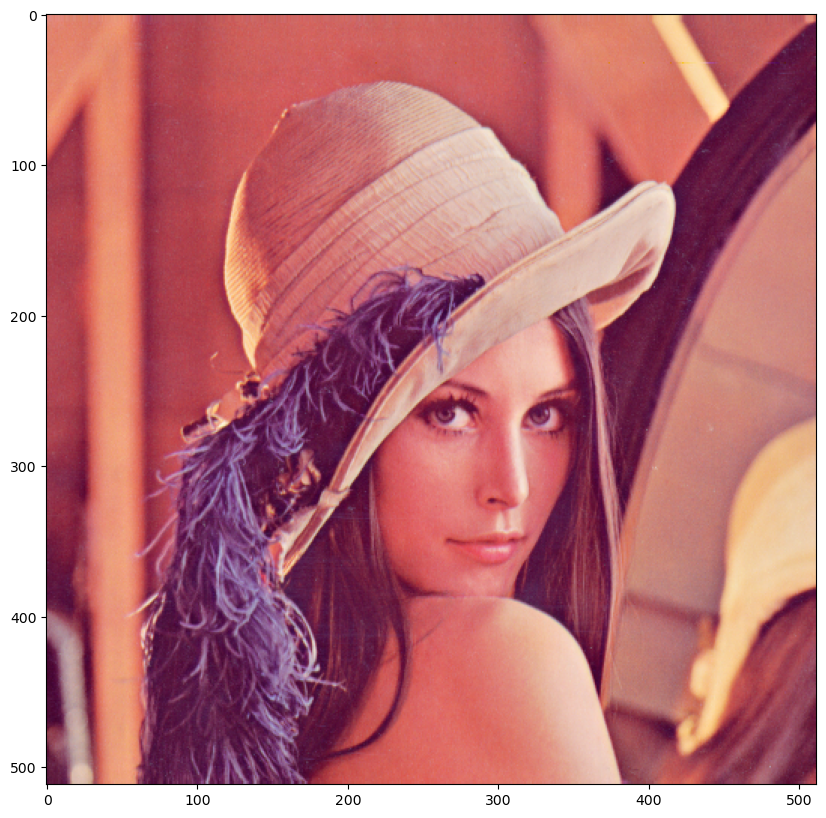

In [ ]:
plt.figure(figsize=(10,10)) #tạo cửa sổ hiện thị với kích thước 10x10 inch
plt.imshow(array) #hiển thị ảnh từ mảng numpy array
plt.show() #hiển thị hình ảnh

We can use numpy slicing, for example, we can return the first 256 rows corresponding to the top half of the image:


In [ ]:
rows = 256 #gán số hàng = 256

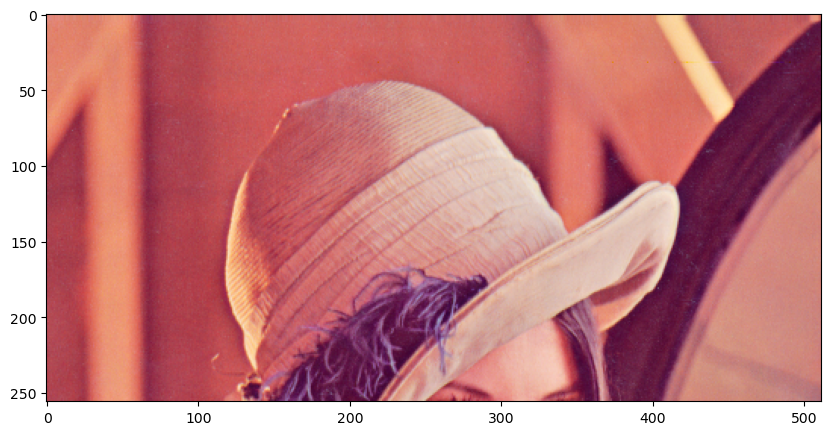

In [ ]:
plt.figure(figsize=(10,10)) #tạo cửa sổ hiển thị kích thước 10x10 inch
plt.imshow(array[0:rows,:,:]) #hiển thị ảnh gồm 256 hàng đầu tiên của ảnh gốc 
plt.show() #hiển thị hình ảnh

We can also return the first 256 columns corresponding to the first half of the image.


In [ ]:
columns = 256 #gán số cột = 256

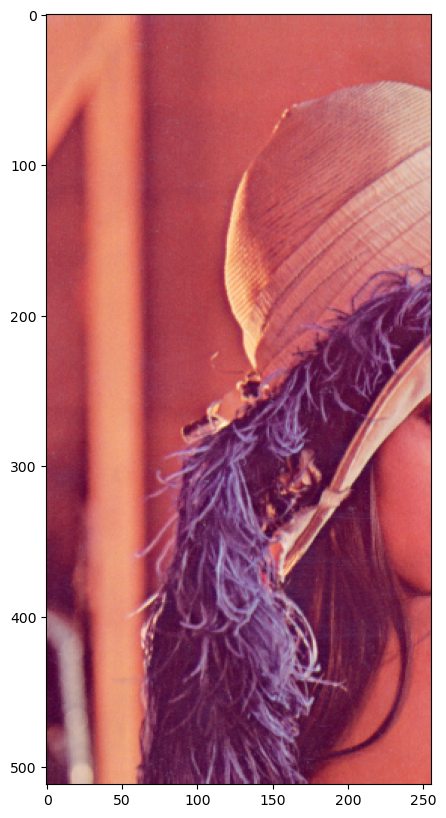

In [43]:
plt.figure(figsize=(10,10)) #tạo cửa sổ hiện thị kích thước 10x10 inch
plt.imshow(array[:,0:columns,:]) #hiển thị ảnh gồm 256 cột đầu tiên của ảnh gốc
plt.show() #hiển thị hình ảnh

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


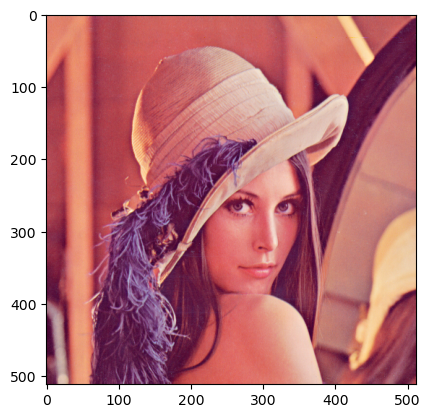

In [ ]:
A = array.copy() #tạo bản sao của mảng array và lưu vào biến A
plt.imshow(A) #hiển thị ảnh từ mảng A
plt.show() #hiển thị hình ảnh

If we do not apply the method copy(), the variable will point to the same location in memory. Consider the array B. If we set all values of array A to zero, as B points to A, the values of B will be zero too:


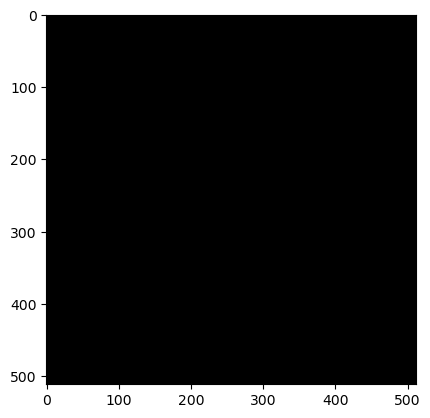

In [ ]:
B = A #gán B trỏ tới cùng vùng nhớ mảng A
A[:,:,:] = 0 #gán tất cả giá trị pixel trong A = 0
plt.imshow(B) # hiển thị ảnh B
plt.show() #hiển thị hình ảnh

We can also work with the different color channels. Consider the baboon image: 


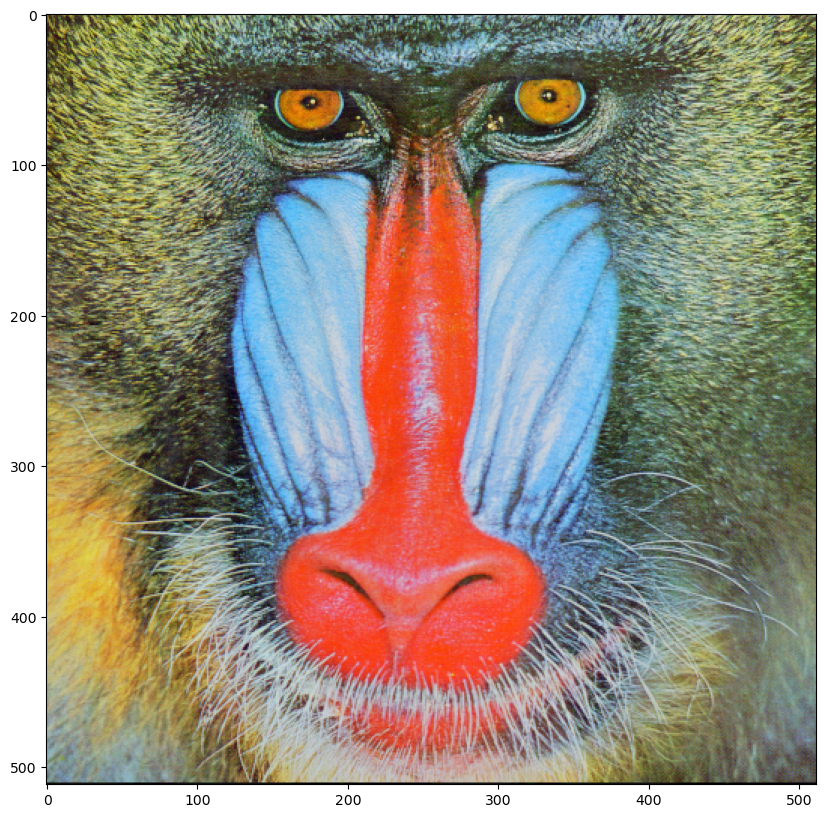

In [ ]:
baboon_array = np.array(baboon) #chuyển ảnh baboon thành mảng numpy và lưu vào biến baboon_array
plt.figure(figsize=(10,10)) #tạo cửa sổ hiện thị mới với kích thước 10x10 inch
plt.imshow(baboon_array) #hiển thị ảnh từ mảng baboon_array
plt.show()

We can plot the red channel as intensity values of the red channel.


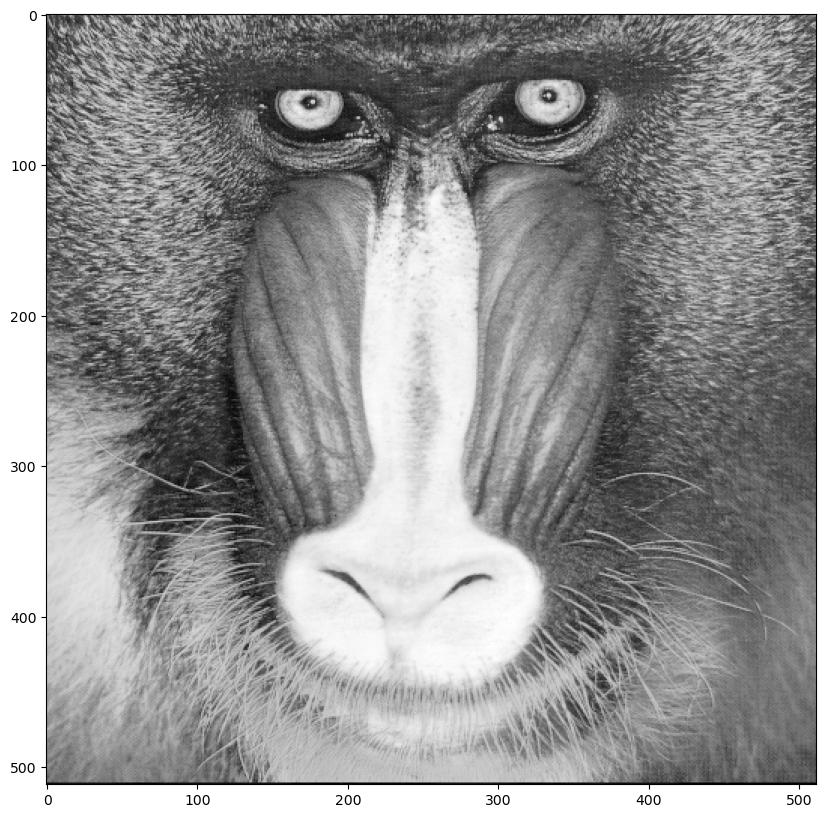

In [ ]:
baboon_array = np.array(baboon) #chuyển ảnh baboon thành mảng numpy và lưu vào biến baboon_array
plt.figure(figsize=(10,10)) #tạo cửa sổ hiện thị mới với kích thước 10x10 inch
plt.imshow(baboon_array[:,:,0], cmap='gray') #hiển thị kênh màu đỏ của ảnh baboon dưới dạng ảnh xám
plt.show() #hiển thị hình ảnh

Or we can create a new array and set all but the red color channels to zero. Therefore, when we display the image it appears red:


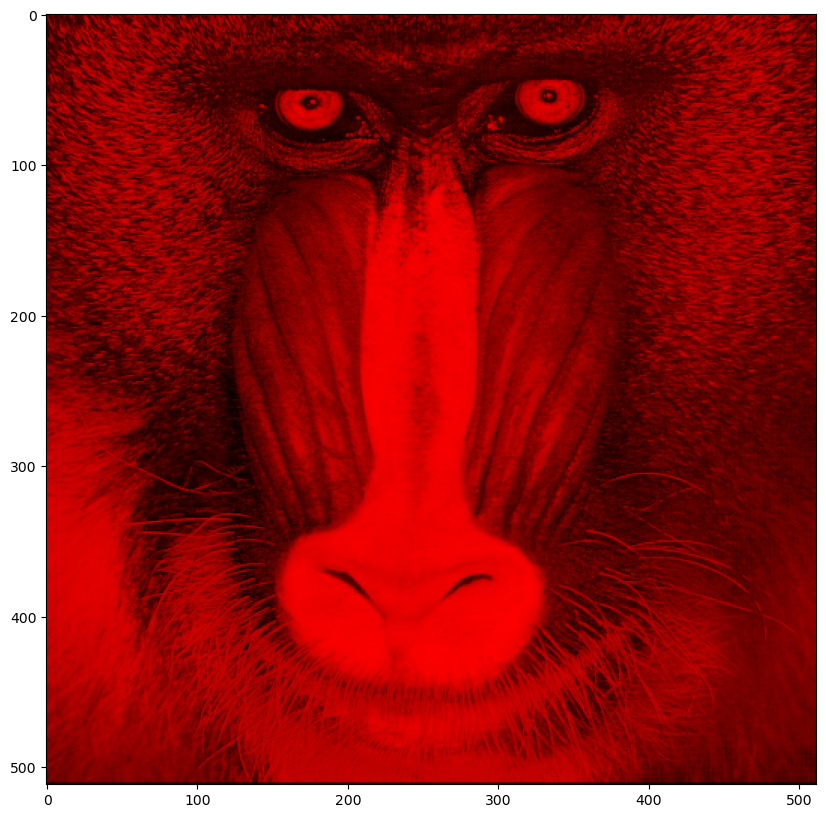

In [ ]:
baboon_red=baboon_array.copy() #tạo bản sao của mảng baboon_array và lưu vào biến baboon_red
baboon_red[:,:,1] = 0 #gán tất cả giá trị kênh màu xanh lá (chỉ số 1) trong baboon_red = 0
baboon_red[:,:,2] = 0 #gán tất cả giá trị kênh màu xanh dương (chỉ số 2) trong baboon_red = 0
plt.figure(figsize=(10,10)) #tạo cửa sổ hiện thị kích thước 10x10 inch
plt.imshow(baboon_red)  #hiển thị ảnh baboon_red
plt.show() #hiển thị hình ảnh

We can do the same for blue:


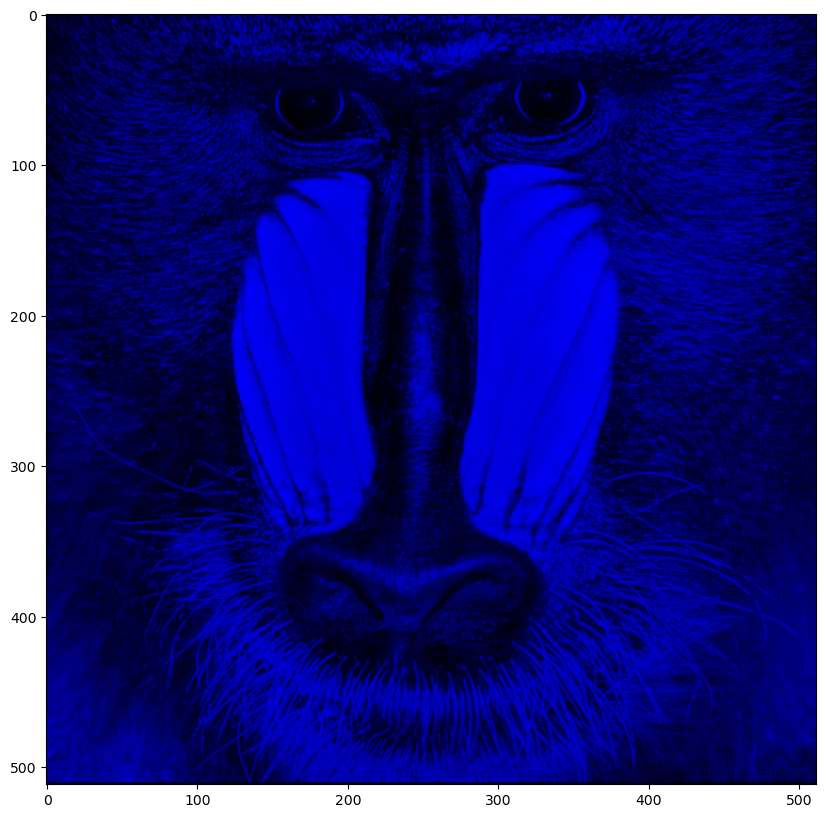

In [ ]:
baboon_blue=baboon_array.copy() #tạo bản sao của mảng baboon_array và lưu vào biến baboon_blue
baboon_blue[:,:,0] = 0 #gán tất cả giá trị kênh màu đỏ (chỉ số 0) trong baboon_blue = 0
baboon_blue[:,:,1] = 0 #gán tất cả giá trị kênh màu xanh lá (chỉ số 1) trong baboon_blue = 0
plt.figure(figsize=(10,10)) #tạo cửa sổ hiện thị kích thước 10x10 inch
plt.imshow(baboon_blue) #hiển thị ảnh baboon_blue
plt.show() #hiển thị hình ảnh

### Question 1: 
Use the image `lenna.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `blue_lenna`, convert the image into a numpy array we can manipulate called `blue_array`, get the blue channel out of it, and finally plot the image


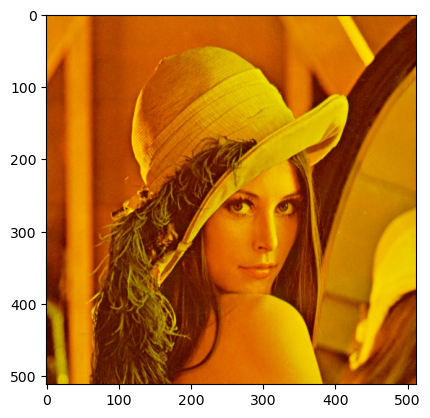

In [ ]:
# write your code here
image = Image.open('lenna.png') #mở file ảnh lenna.png và lưu vào biến image
# Convert the image into a numpy array
blue_array = np.array(image) #chuyển ảnh image sang mảng NumPy và lưu vào biến blue_array
# Get the blue channel out of it
blue_array[:, :, 2] = 0 #Đặt toàn bộ kênh màu xanh dương (channel 2) bằng 0, tức là loại bỏ màu xanh dương khỏi ảnh

# Plot the image
plt.imshow(blue_array) #Hiển thị ảnh sau khi đã chỉnh sửa kênh màu
plt.show() #hiển thị hình ảnh

Double-click **here** for a hint.

<!-- The hint is below:

blue_array[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

blue_lenna = Image.open('lenna.png')
blue_array = np.array(blue_lenna)
blue_array[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).
